In [1]:
import torch
import diffusers
from diffusers import StableDiffusionPipeline
from diffusers import DPMSolverMultistepScheduler

/home/chris/.conda/envs/ai/lib/python3.9/site-packages/tqdm/auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
def get_inputs(prompt, batch_size=1):
  generator = [torch.Generator("cuda").manual_seed(i) for i in range(batch_size)]
  prompts = batch_size * [prompt]
  num_inference_steps = 20

  return {"prompt": prompts, "generator": generator, "num_inference_steps": num_inference_steps}

In [3]:
from PIL import Image

def image_grid(imgs, rows=3, cols=2):
    w, h = imgs[0].size
    grid = Image.new('RGB', size=(cols*w, rows*h))

    for i, img in enumerate(imgs):
        grid.paste(img, box=(i%cols*w, i//cols*h))
    return grid

In [4]:
ckpt = 'stabilityai/stable-diffusion-2'
pipe = StableDiffusionPipeline.from_pretrained(ckpt, torch_dtype=torch.float16)

Fetching 16 files: 100%|██████████| 16/16 [00:00<00:00, 26962.18it/s]
ftfy or spacy is not installed using BERT BasicTokenizer instead of ftfy.


In [5]:
pipe = pipe.to('cuda')
pipe.enable_attention_slicing()
pipe.scheduler = DPMSolverMultistepScheduler.from_config(pipe.scheduler.config)

In [6]:
prompt = 'portrait photo of a old warrior chief'

100%|██████████| 20/20 [00:19<00:00,  1.04it/s]


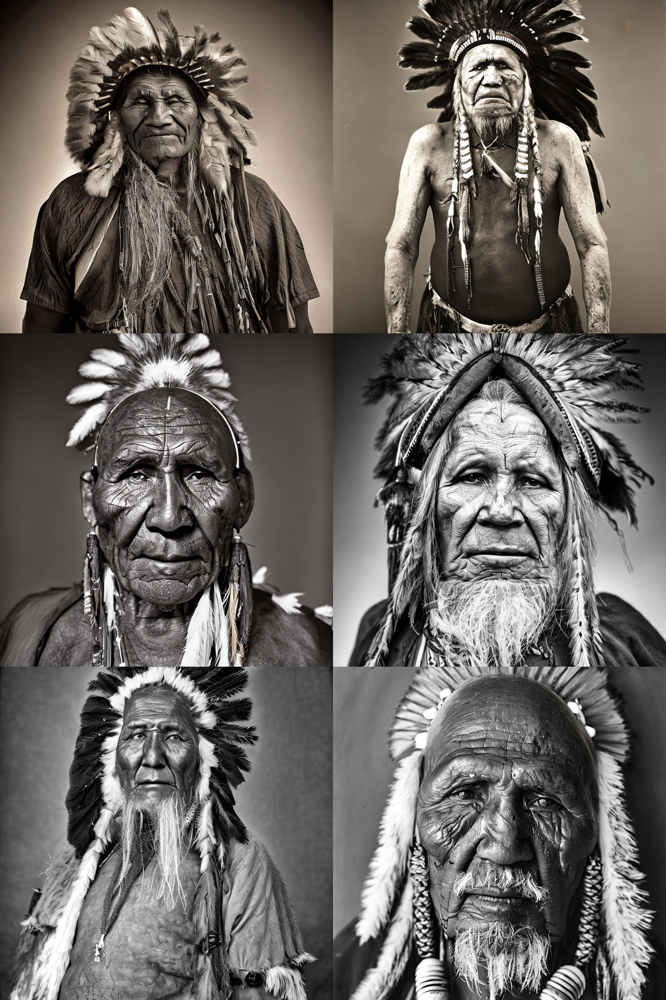

In [7]:
images = pipe(**get_inputs(prompt, batch_size=6)).images                                                                                                                                                                                              
image_grid(images)

100%|██████████| 20/20 [00:12<00:00,  1.63it/s]


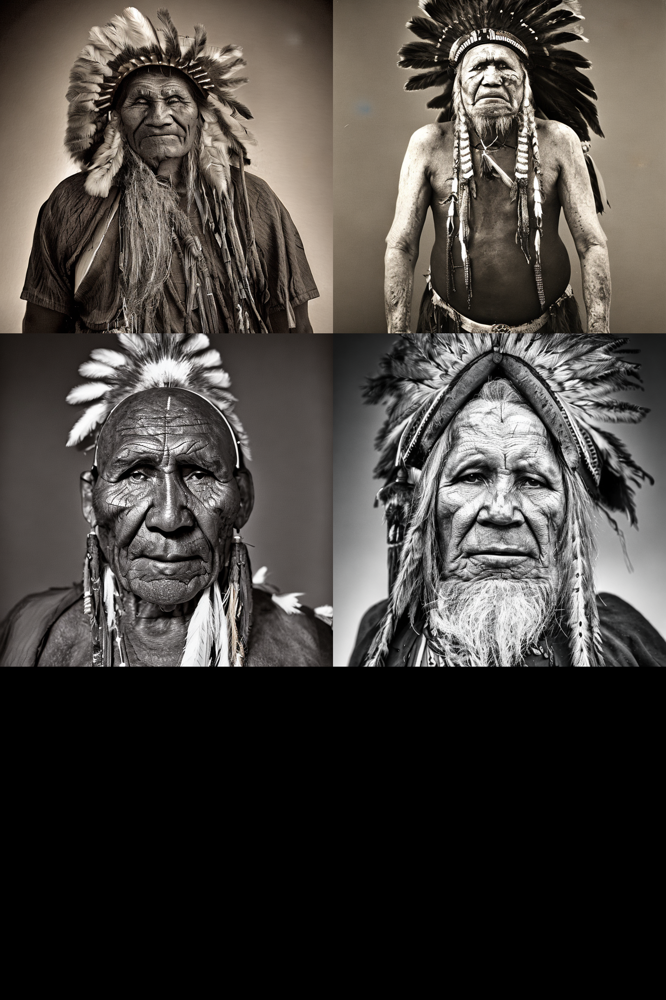

In [8]:
del images

images = pipe(**get_inputs(prompt, batch_size=4)).images
image_grid(images)